In [1]:
import numpy as np
import PIL
import matplotlib.pyplot as plt
import pandas as pd
import os
import copy
import scipy.io
import sys
sys.path.append('/user_data/mmhender/texture_synthesis/code/')
import things_utils

In [2]:
concepts_filename = '/user_data/mmhender/things/concepts_removeoverlap.npy'
concepts_use = np.load(concepts_filename,allow_pickle=True).item()
categ_names = concepts_use['categ_names']
concept_names = concepts_use['concept_names']
image_names = concepts_use['image_names']
concept_ids = concepts_use['concept_ids']

concepts_all = np.concatenate(concept_names)
categ_all = np.repeat(categ_names, [len(cc) for cc in concept_names])

In [3]:
# categ_names

In [4]:
categ_exclude = ['animal','food','clothing_accessory', 'container', 'kitchen_appliance', 'tool']
concepts_exclude = [
                    'face','hand','foot','stomach', 'skull', 'bone', 
                    'shirt', 'robe', 'cloak', 'sweater', 'stockings', 'lingerie', 'outfit', 'coat', 'coverall', 'pants', 'suit', 
                    'ice','ice_cube','cake', 'sundae', 'milkshake',
                    'coffee', 
                    'computer', 
                    'avocado', 'berry', 'melon', 
                    'bedpost', 'bed', 'chair', 'table', 'couch', 'stool', 
                    'candle','candlestick', 
                    'bug', 'scorpion', 'spider', 'tick',
                    'knife', 'timer', 
                    'defibrillator','eye_patch', 
                    'drum', 'horn', 'keyboard', 
                    'notepad', 'tack', 
                    'gasket', 'rim', 'wheel', 'brake', 'odometer','speedometer', 'spark_plug', 'windshield',
                    'tree', 'flower', 'see'd
                    'flag', 'mouthpiece', 'wedge', 'sled', 'face_mask', 'ski_boots',
                    'blower', 'chainsaw', 'drill', 'polisher', 'axe', 'hammer', 'jack',
                    'ball', 'tricycle', 'robot',
                    'gourd', 
                    'car', 'bike', 'truck', 'bus', 'train', 'cart',  'chariot', 
                    'gun', 'bomb', 
                    ] 

In [5]:
cat_exclude_df = pd.DataFrame({'categ_exclude': categ_exclude})
things_stim_path = '/user_data/mmhender/things/'
filename_save = os.path.join(things_stim_path, 'categ_exclude.csv')
cat_exclude_df.to_csv(filename_save)

In [6]:
conc_exclude_df = pd.DataFrame({'concepts_exclude': concepts_exclude})
things_stim_path = '/user_data/mmhender/things/'
filename_save = os.path.join(things_stim_path, 'conc_exclude.csv')
conc_exclude_df.to_csv(filename_save)

In [8]:
categ_exclude = list(pd.read_csv(os.path.join(things_stim_path, 'categ_exclude.csv'))['categ_exclude'])
concepts_exclude = list(pd.read_csv(os.path.join(things_stim_path, 'conc_exclude.csv'))['concepts_exclude'])
categ_exclude, concepts_exclude

(['animal',
  'food',
  'clothing_accessory',
  'container',
  'kitchen_appliance',
  'tool'],
 ['face',
  'hand',
  'foot',
  'stomach',
  'skull',
  'bone',
  'shirt',
  'robe',
  'cloak',
  'sweater',
  'stockings',
  'lingerie',
  'outfit',
  'coat',
  'coverall',
  'pants',
  'suit',
  'ice',
  'ice_cube',
  'cake',
  'sundae',
  'milkshake',
  'coffee',
  'computer',
  'avocado',
  'berry',
  'melon',
  'bedpost',
  'bed',
  'chair',
  'table',
  'couch',
  'stool',
  'candle',
  'candlestick',
  'bug',
  'scorpion',
  'spider',
  'tick',
  'knife',
  'timer',
  'defibrillator',
  'eye_patch',
  'drum',
  'horn',
  'keyboard',
  'notepad',
  'tack',
  'gasket',
  'rim',
  'wheel',
  'brake',
  'odometer',
  'speedometer',
  'spark_plug',
  'windshield',
  'tree',
  'flower',
  'flag',
  'mouthpiece',
  'wedge',
  'sled',
  'face_mask',
  'ski_boots',
  'blower',
  'chainsaw',
  'drill',
  'polisher',
  'axe',
  'hammer',
  'jack',
  'ball',
  'tricycle',
  'robot',
  'gourd',
  '

In [7]:
conc_use = [conc for conc, cat in zip(concepts_all, categ_all) if conc not in concepts_exclude and cat not in categ_exclude]

In [8]:
len(conc_use)

491

In [9]:
conc_use

['cardinal',
 'chick',
 'cockatoo',
 'crow',
 'duck',
 'duckling',
 'eagle',
 'flamingo',
 'goose',
 'hawk',
 'hummingbird',
 'ostrich',
 'owl',
 'parrot',
 'peacock',
 'pelican',
 'penguin',
 'pheasant',
 'pigeon',
 'puffin',
 'rooster',
 'seagull',
 'swan',
 'toucan',
 'turkey',
 'vulture',
 'ankle',
 'arm',
 'chin',
 'ear',
 'elbow',
 'eye',
 'finger',
 'hair',
 'hip',
 'knee',
 'leg',
 'mouth',
 'navel',
 'neck',
 'nose',
 'shoulder',
 'skin',
 'thumb',
 'toe',
 'tongue',
 'tooth',
 'torso',
 'wrist',
 'bathrobe',
 'blazer',
 'blouse',
 'bra',
 'cape',
 'cardigan',
 'chaps',
 'corset',
 'costume',
 'dress',
 'fishnet_stockings',
 'fur_coat',
 'glove',
 'hood',
 'hoodie',
 'jacket',
 'jeans',
 'jersey',
 'jumpsuit',
 'kilt',
 'kimono',
 'lab_coat',
 'leggings',
 'leotard',
 'loincloth',
 'nightshirt',
 'overalls',
 'pajamas',
 'pantsuit',
 'pantyhose',
 'polo_shirt',
 'shawl',
 'shorts',
 'skirt',
 'snowsuit',
 'sock',
 'sweatsuit',
 'swimsuit',
 't-shirt',
 'toga',
 'tube_top',
 't

In [13]:
neach = []

for ca, categ in enumerate(categ_names):
   
    if categ not in categ_exclude:

        conc_inds_plot = np.where(categ_all==categ)[0]
        
        conc_inds_plot = [ci for ci in conc_inds_plot if concepts_all[ci] not in concepts_exclude]
        
        print(len(conc_inds_plot))
        
        neach += [len(conc_inds_plot)]

26
23
47
24
12
13
28
17
16
16
20
15
30
21
20
18
36
23
35
29
22


In [14]:
np.sum(neach)

491

/home/mmhender/myenv/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


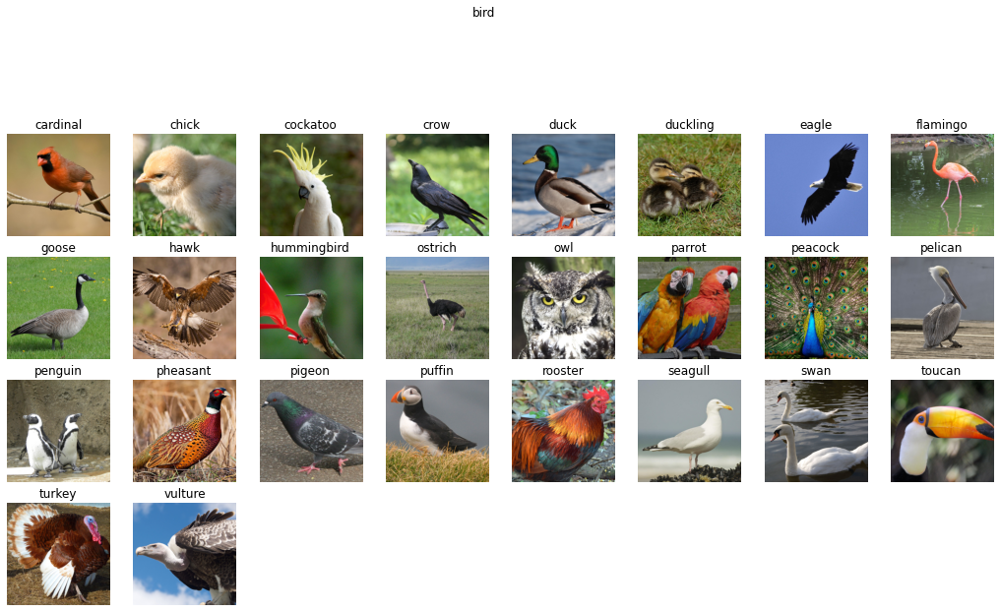

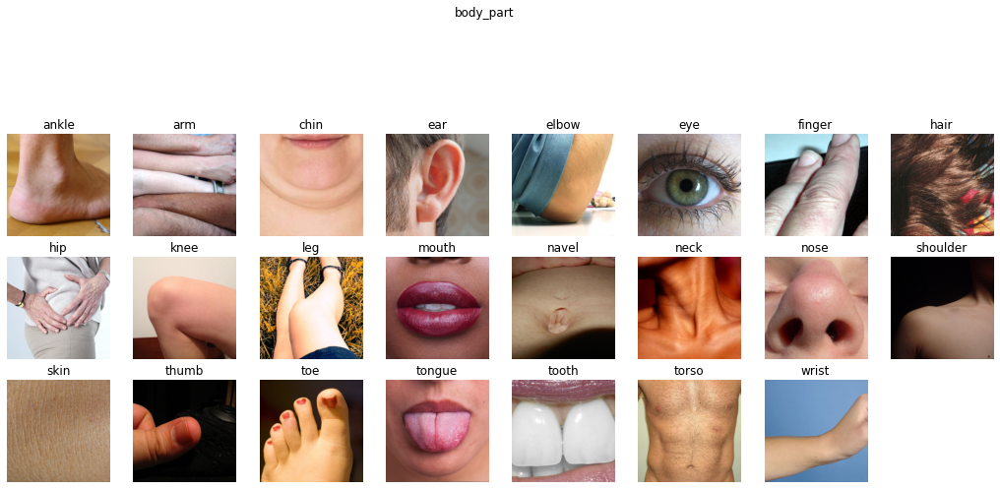

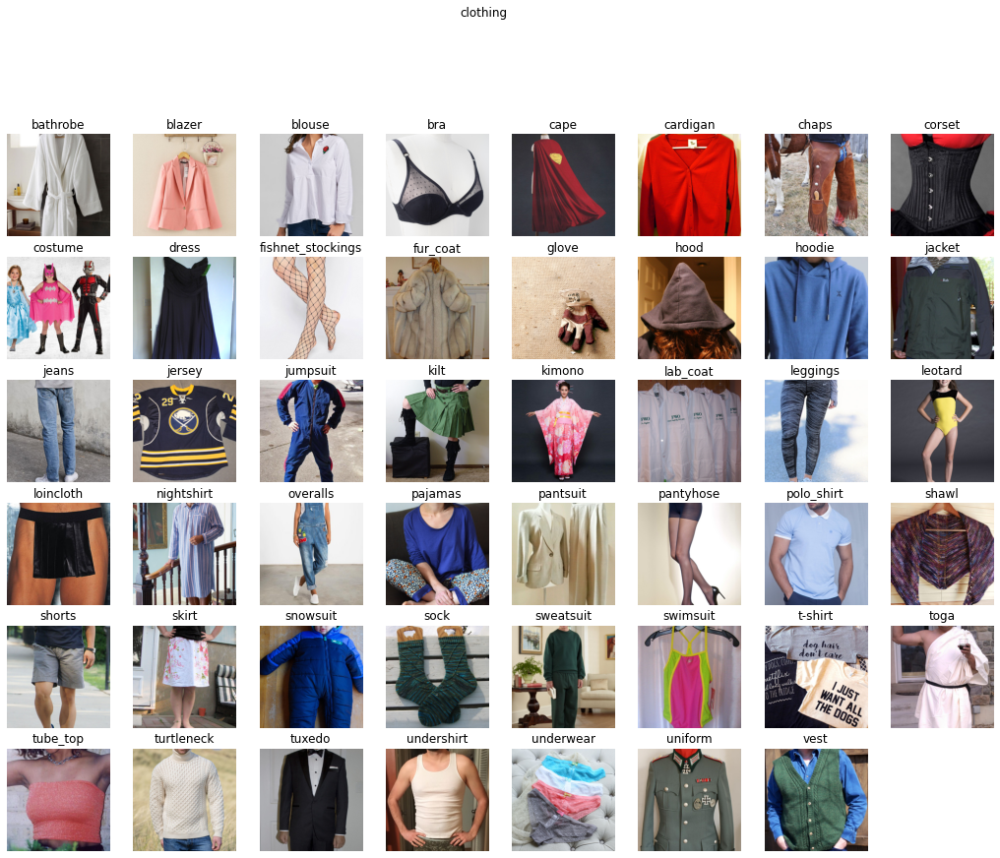

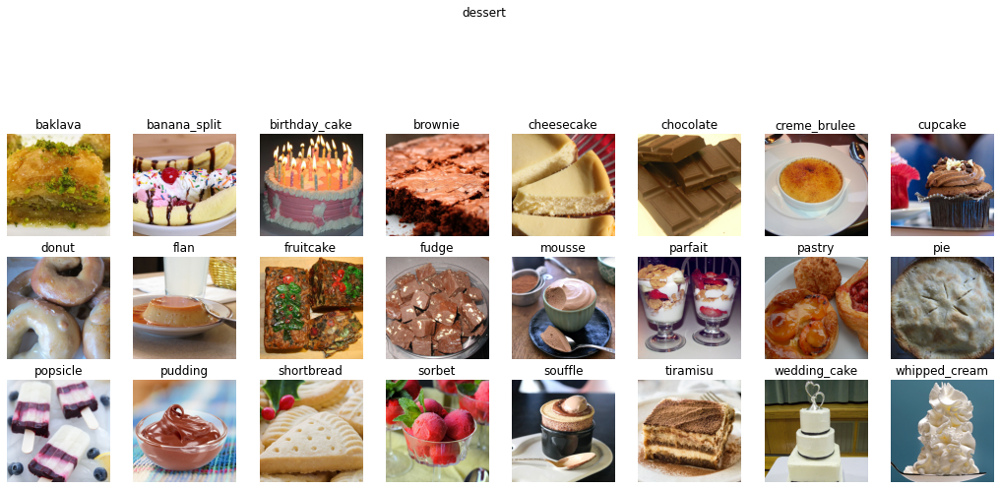

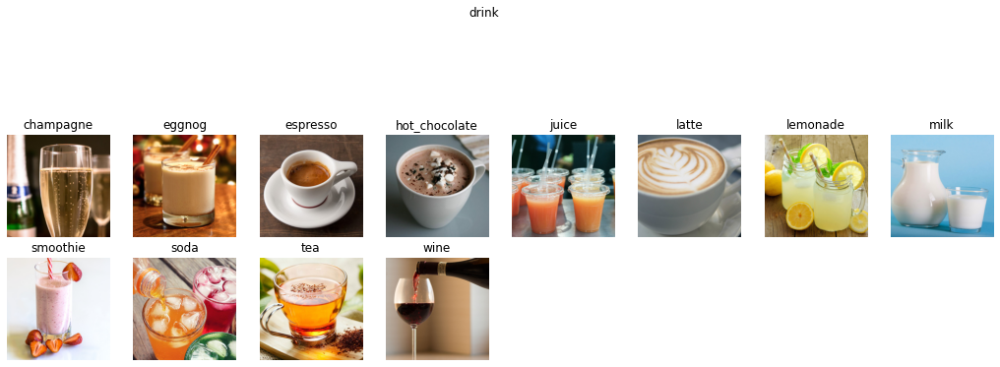

...

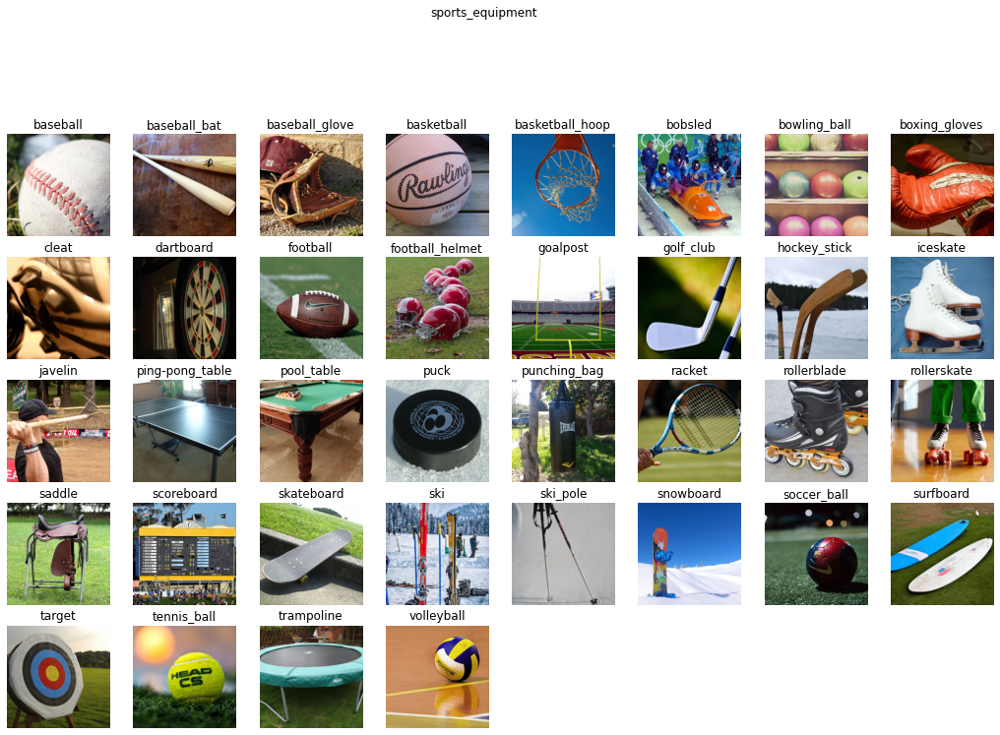

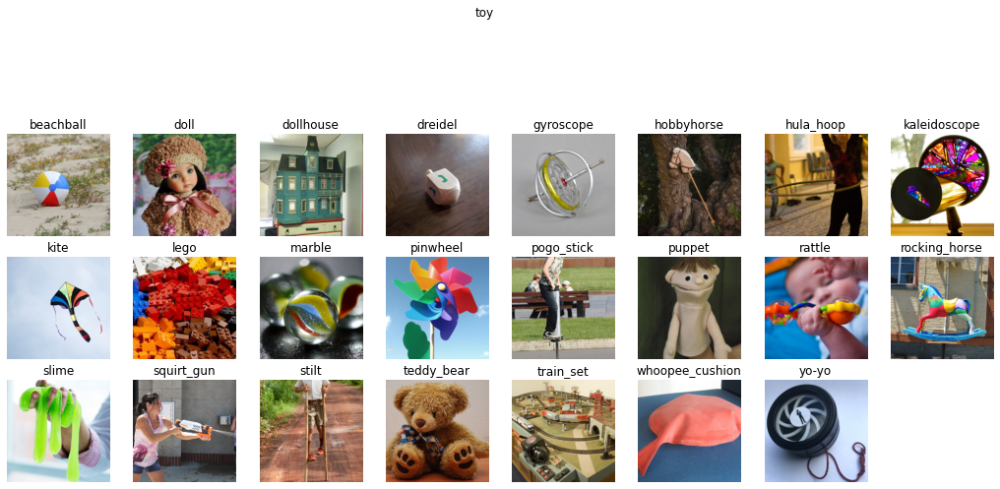

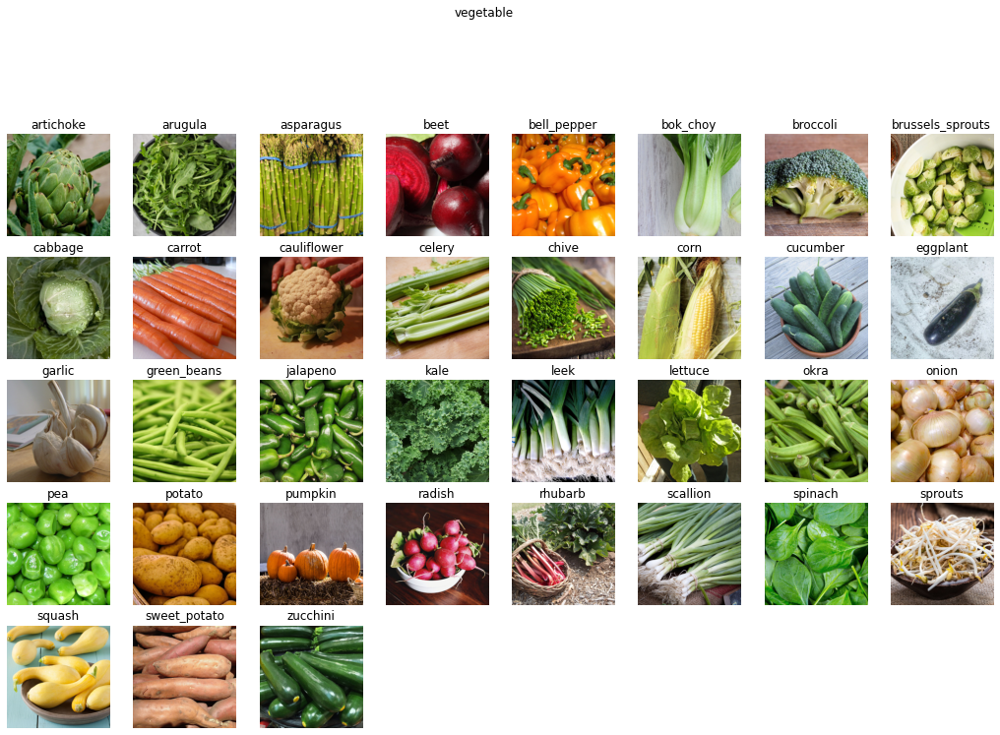

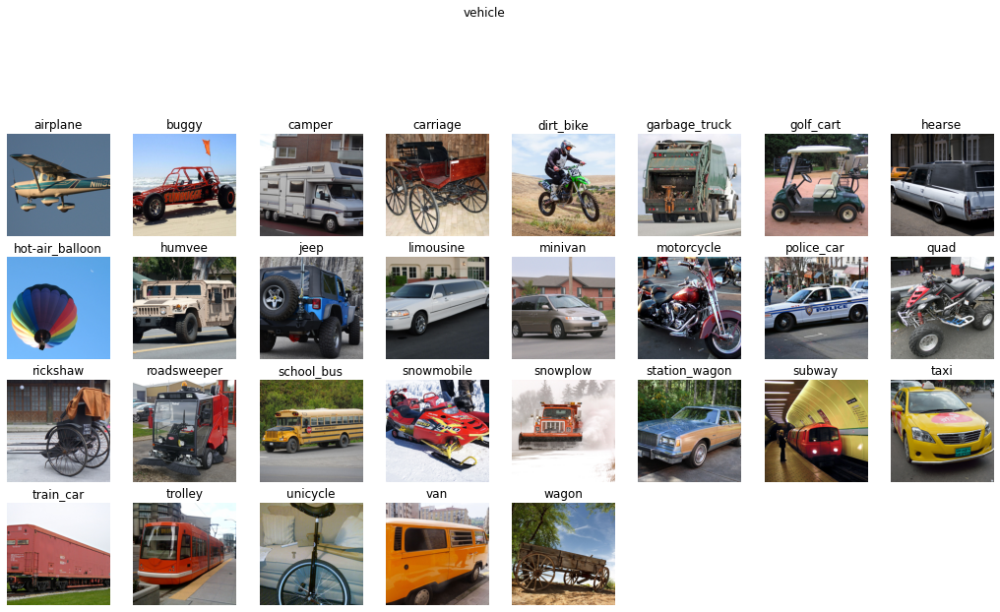

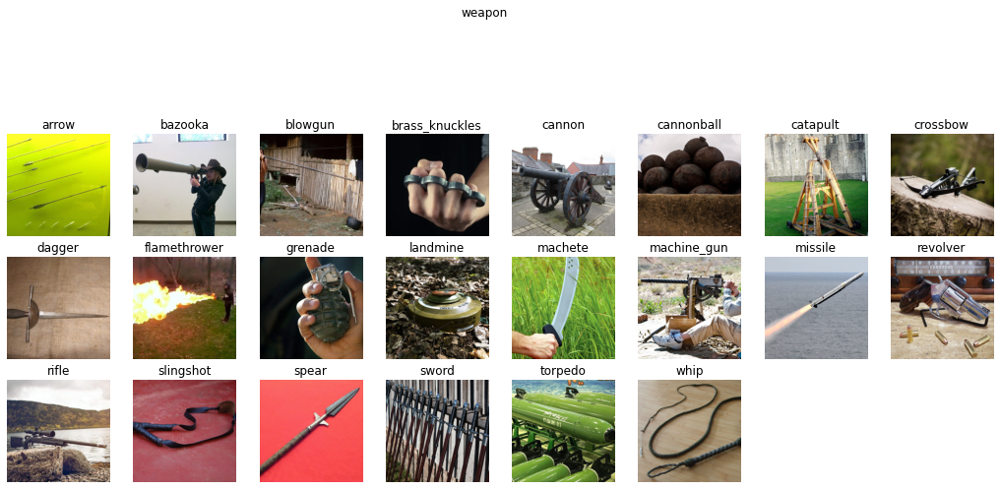

In [9]:
for ca, categ in enumerate(categ_names):
   
    if categ not in categ_exclude:

        conc_inds_plot = np.where(categ_all==categ)[0]
        
        conc_inds_plot = [ci for ci in conc_inds_plot if concepts_all[ci] not in concepts_exclude]
        
        plt.figure(figsize=(18,18))
        pi=0

        for conc_ind in conc_inds_plot:

            categ = categ_all[conc_ind]
            conc = concepts_all[conc_ind]

            ii=0;

            filename = things_utils.get_filename(categ, conc, ii)
            im = PIL.Image.open(filename)
            im = im.resize([256,256])

            pi+=1
            plt.subplot(8,8, pi)
            plt.imshow(im)
            plt.axis('off')
            if ii==0:
                # plt.title('%s: %s'%(categ, conc))
                plt.title('%s'%(conc))
                
        plt.suptitle(categ)